# Neural Style Transfer

## Introduction

In our project, we try to implement a typical case of transfer learning : style transfer. Our goal will thus be to get the style from a reference picture, and apply it to a target picture, as shown in various examples throughout the internet. Through all of this notebook, we will be using tf.keras, and its various functionalities, such as functional API, optimizers and pretrained models developped by various researchers.

Our project is based on [Gatys' paper](https://arxiv.org/abs/1508.06576), published in 2015 and paving the way for many more papers using more advanced technology and more advanced neural nets.

We also tried using GANs, but due to the limitation of google colab, as well as our limited knowledge and time, we prefered to focus on more simple CNNs.

### We will follow the following general steps :

1. Data visualization
2. Data preprocessing
3. Loss functions set up
4. Model creation
5. Optimization for loss function

## Import images and modules



We begin by importing the images we will use and store them at the right place to retrieve them later (it's easier this way than just manually importing them from one of our personal computers).

In [ ]:
import os
img_dir = '/tmp/nst'
if not os.path.exists(img_dir):
    os.makedirs(img_dir)

!wget --quiet -P /tmp/nst/ https://assets.catawiki.nl/assets/2020/9/28/d/7/1/d71f8039-17e9-45ef-94fe-05d30e46d2ab.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/5/5f/Louis_XIV_of_France.jpg

!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg
!wget --quiet -P /tmp/nst/ https://www.lemagducine.fr/wp-content/uploads/2020/02/le-chateau-dans-le-ciel-film-animation-Hayao-Miyazaki.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/7/7b/Ch%C3%A2teau_de_Chambord_-_19-08-2015_-_Arnaud_Scherer.jpg

!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/05/Claude_Monet_038.jpg # Claude Monet
!wget --quiet -P /tmp/nst/ https://www.meeriwild.com/wp-content/uploads/2020/06/lac-de-c%C3%A9c%C3%A9l%C3%A8s-scaled.jpg

!wget --quiet -P /tmp/nst/ https://images.midilibre.fr/api/v1/images/view/5b4736eb8fe56f2bc3186dae/original/image.jpg #Vergèze, Paul Cézanne
!wget --quiet -P /tmp/nst/ https://kajabi-storefronts-production.global.ssl.fastly.net/kajabi-storefronts-production/blogs/24132/images/wrvTNwTSxuWjvfL6hdgy_Composition-photo-paysage.jpg

!wget --quiet -P /tmp/nst/ https://www.kazoart.com/blog/wp-content/uploads/2017/12/804px-The_Scream.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/thumb/5/56/Donald_Trump_official_portrait.jpg/1200px-Donald_Trump_official_portrait.jpg

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import numpy as np
from PIL import Image
import time
import functools

import tensorflow as tf

from tensorflow.python.keras.preprocessing import image as kp_image
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

We enable eager execution. TensorFlow's eager execution is an imperative programming environment that evaluates operations immediately, without building graphs. This makes it easy to get started with TensorFlow and debug models.

In [ ]:
tf.executing_eagerly()

True

In [ ]:
# model = tf.keras.applications.Xception(include_top=False, weights="imagenet")
# print(model.summary())

## Import content and style images and visualization

Here, we simply load the pictures we chose as our content and style pictures.

In [ ]:
content_path = '/tmp/nst/wrvTNwTSxuWjvfL6hdgy_Composition-photo-paysage.jpg'
style_path = '/tmp/nst/image.jpg'

In [ ]:

def load_img(path_to_img):
  max_dim = 512
  img = Image.open(path_to_img)
  long = max(img.size)
  scale = max_dim/long
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  
  img = kp_image.img_to_array(img)
  
  # We need to broadcast the image array such that it has a batch dimension 
  img = np.expand_dims(img, axis=0)
  return img

We will also make a function to plot a picture, since seeing the picture for ourselves is a very important part of this project :

In [ ]:
def imshow(img, title=None):
  # Remove the batch dimension
  out = np.squeeze(img, axis=0)
  # Normalize for display 
  out = out.astype('uint8')
  plt.imshow(out)
  if title is not None:
    plt.title(title)
  plt.imshow(out)

These are input content and style images. Our goal is then to create an image resembling content image, but with a style that can be recognized as the one of the style image.

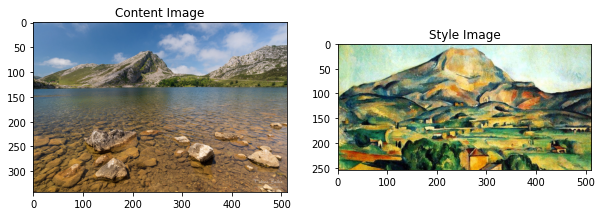

In [ ]:
plt.figure(figsize=(10,10))

content = load_img(content_path).astype('uint8')
style = load_img(style_path).astype('uint8')

plt.subplot(1, 2, 1)
imshow(content, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style, 'Style Image')
plt.show()

## Data preprocessing
We will now create methods to load and preprocess the images, in order to make them as usable as possible by the network. For example, for VGG19, this means that we will normalize each BGR channel by `mean = [103.939, 116.779, 123.68]`.

We used 3 different pretrained networks included in keras : VGG16, its deeper relative VGG19, and Xception. The main difference between these networks is that VGGnets are simple convolutionnal layers stacked on top of each other, with some pooling layers inbetween, and ended by two fully connected layers and a softmax classifier, while Xception computes various sizes of convolution in the same module of the net, stacking and feeding them to the next level afterwards.

In [ ]:
def load_and_process_img(path, model_name):
  img = load_img(path)
  # img = tf.keras.applications.vgg19.preprocess_input(img)
  if model_name == 'vgg19':
    img = tf.keras.applications.vgg19.preprocess_input(img)
  elif model_name == 'vgg16':
    img = tf.keras.applications.vgg16.preprocess_input(img)
  elif model_name == 'Xception':
    img = tf.keras.applications.xception.preprocess_input(img)
  else: 
    raise ValueError("Invalid model name")
  return img

We then have to define a reverse function to this preprocessing, in order to view the results of our model. We also have to clip the values so that they can be viewed. Indeed, the output image of the optimization can take its values anywhere in $[- \infty$, $\infty]$, while the values of BGR channels must be in $[0, 255]$.

In [ ]:
def deprocess_img(processed_img, model_name):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
  if len(x.shape) != 3:
    raise ValueError("Invalid input to deprocessing image")

  # perform the inverse of the preprocessing step 
  if model_name == 'vgg19':
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
  elif model_name == 'vgg16':
    x[:, :, 0] += 123.675
    x[:, :, 1] += 116.28
    x[:, :, 2] += 103.53  
  elif model_name == 'Xception':
    pass
  else:
    raise ValueError("Invalid model name")
  
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

## Building the model

### Content and style layers

To get the content and style representations of our pictures, we will access layers of the model. However, these layers aren't just the exit of the net, but rather some intermediate layers. These layers represent higher orders of features the deeper they are in the model : for example a basic shape like a small triangle will be in the very first layers.

The reason we use intermediate layers is that they are the very way a convolutional network can classify images (what our networks were initally trained to do) : they turn groups of raw pixels into features, and thus understand the layout of pictures. It is somewhere in these layers that the neural network extracts features, and thus the style.

We expect the more basic networks (that is, VGG16 and VGG19) to perform better on this task, as their feature map will be better suited for style transfer. To access the intermediate layers, we will use Keras functional API. This way, we just have to get their corresponding outputs, and defining the model is also simplified to just stating the inputs and outputs. 

We will proceed by first loading the pretrained network, then getting the layers we want. Then, we define the model : its input will be the content image, and its outputs will be the outputs of the layers we retrieved (content and style layers) :

In [ ]:
def get_model(model_name):
  """ Creates our model with access to intermediate layers. 
  
  This function will load the VGG19 model and access the intermediate layers. 
  These layers will then be used to create a new model that will take input image
  and return the outputs from these intermediate layers from the VGG model. 
  
  Returns:
    returns a keras model that takes image inputs and outputs the style and 
      content intermediate layers. 
  """
  # Load our model. We load pretrained models, trained on imagenet data
  
  if model_name == 'vgg19':
    model = tf.keras.applications.vgg19.VGG19(include_top=False, weights="imagenet")
    # Content layer where will pull our feature maps
    content_layers = ['block5_conv2']
    # Style layer we are interested in
    style_layers = ['block1_conv1',
                    'block2_conv1',
                    'block3_conv1', 
                    'block4_conv1', 
                    'block5_conv1'
                  ]
  elif model_name == 'vgg16':
    model = tf.keras.applications.vgg16.VGG16(include_top=False, weights="imagenet")
    content_layers = ['block5_conv2'] #'block5_conv2',
    style_layers = ['block1_conv1',
                    'block2_conv1',
                    'block3_conv1', 
                    'block4_conv1', 
                    'block5_conv1'
                  ]
  elif model_name == 'Xception':
    model = tf.keras.applications.Xception(include_top=False, weights="imagenet")
    content_layers = ['conv2d_3']
    style_layers = ['block1_conv1','block1_conv2','conv2d_1']#,'block1_conv3']
  else:
    raise ValueError("Invalid model name")
  
  num_content_layers = len(content_layers)
  num_style_layers = len(style_layers)

  model.trainable = False
  # Get output layers corresponding to style and content layers 
  style_outputs = [model.get_layer(name).output for name in style_layers]
  content_outputs = [model.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs
  # Build model 
  return models.Model(model.input, model_outputs), num_style_layers, num_content_layers

## Defining content and style loss functions

### Content loss

The content loss is computed using the following procedure.
We pass the content image and the base image through the preprocessed network to obtain the intermediate layers (content and style layers) outputs from our model.
Then we compute the euclidean distance between the two feature representations of those images.


Let p and x be the content image and the base image, and $P^{l}$ and $F^{l}$ the activation of the $i^{th}$ filter at position $j$ in layer $l$.  
We define the content loss between the two feature representations: 
$$L^{l}_{content}(p, x) = \sum_{i, j} (F^{l}_{ij}(x) - P^{l}_{ij}(p))^2$$

We perform a classic backpropagation so that to unsure that the base image have a simular feature representation for the content layer as the content image.

In [ ]:
def get_content_loss(base_content, target):
  return tf.reduce_mean(tf.square(base_content - target))

### Style loss

The style loss computation involve a different method than for the content loss. The idea is to compute the mean-squared distance between entries of the Gram matrix from the style image and the base image.

We recall that Gram matrix of layer $l$ coefficient $G_{ij}^{l}$ is defined as follow:
$$G_{ij}^{l} = \sum_{k} F^l_{ik}F^l_{kj} $$

Let a and x be the style image and the base image, and $A^{l}$ and $G^{l}$ their style representations in layer $l$.
The contribution of layer $l$ to the total style loss is:
$$E_l = \frac{1}{4N_l^2M_l^2} \sum_{i,j}(G^l_{ij} - A^l_{ij})^2$$

and the total style loss between the two feature representations is:
$$L_{style}(a, x) = \sum_{l \in L} w_{l} E_{l}$$

with $w_{l}$  weighting factors of the contribution of each layer to the total loss. In this project, we weight each layer equally and $w_{l} = \frac{1}{L}$.

In [ ]:
def gram_matrix(input_tensor):
  # We make the image channels first 
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)   # n * channels non?

def get_style_loss(base_style, gram_target):
  """Expects two images of dimension h, w, c"""
  # height, width, num filters of each layer
  # We scale the loss at a given layer by the size of the feature map and the number of filters
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  
  return tf.reduce_mean(tf.square(gram_style - gram_target))# / (4. * (channels ** 2) * (width * height) ** 2)

## Apply style transfer to our images

### Feature representation

To begin, we will define a function that loads the content and style image, feed them forward through the pretrained network, which will then output the content and style feature representations according to our model. 

In [ ]:
def get_feature_representations(model, content_path, style_path,num_style_layers):
  """Computes the content and style feature representations.

  This function loads and preprocesses both the content and style 
  images from their path. It then feeds them through the network to get
  the outputs of the intermediate layers.
  """
  # Load our images in 
  content_image = load_and_process_img(content_path, model_name)
  style_image = load_and_process_img(style_path, model_name)
  
  # batch compute content and style features
  style_outputs = model(style_image)
  content_outputs = model(content_image)
  
  
  # Get the style and content feature representations from our model  
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features

### Run Gradient Descent 

We perform our gradient descend using the Adam optimizer, or the Stochastic Gradient Descend, or the RMSprop. We compare the results obtained using those optimizers in the section "Compare different optimize" below. Instead of updating the weights of the network we update the output image such that it minimizes our loss. This means that we train the input image and not the network itself. In order to do this, we must know how we calculate our loss and gradients. 

Note: The L-BFGS optimizer has been described in the litterature as one of the optimizer that produces the best results. However it is not implemented in the Keras module so we sticked to the classic optimizer implemented in Keras.


### Computing the loss and gradients
Here we use [**tf.GradientTape**](https://www.tensorflow.org/programmers_guide/eager#computing_gradients) to compute the gradient. It allows us to take advantage of the automatic differentiation available by tracing operations for computing the gradient later. It records the operations during the forward pass and then is able to compute the gradient of our loss function with respect to our input image for the backwards pass.

In [ ]:
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features,num_content_layers,num_style_layers):
  """This function will compute the loss total loss.
  
  Arguments:
    model: The model that will give us access to the intermediate layers
    loss_weights: The weights of each contribution of each loss function. 
      (style weight, content weight, and total variation weight)
    init_image: Our initial base image. This image is what we are updating with 
      our optimization process. We apply the gradients wrt the loss we are 
      calculating to this image.
    gram_style_features: Precomputed gram matrices corresponding to the 
      defined style layers of interest.
    content_features: Precomputed outputs from defined content layers of 
      interest.
      
  Returns:
    returns the total loss, style loss, content loss, and total variational loss
  """
  style_weight, content_weight = loss_weights
  
  # Feed our init image through our model. This will give us the content and 
  # style representations at our desired layers. Since we're using eager
  # our model is callable just like any other function!
  model_outputs = model(init_image)
  
  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]
  
  style_score = 0
  content_score = 0

  # Accumulate style losses from all layers
  # Here, we equally weight each contribution of each loss layer
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
  # Accumulate content losses from all layers 
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
  
  style_score *= style_weight
  content_score *= content_weight

  # Get total loss
  loss = style_score + content_score 
  return loss, style_score, content_score

As specified above, we compute the gradient descent using tf.GradientTape(): 

In [ ]:
def compute_grads(cfg):
  with tf.GradientTape() as tape: 
    all_loss = compute_loss(**cfg)
  # Compute gradients wrt input image
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

### Optimization loop

$run\_style\_transfer$ is the core function of this project. It run the style transfer algorithm over a certain number of iterations $num\_iterations$ and plot the base image every $display\_interval$. In particular, this function has the arguments $model\_name$ and $optimizer$ to allow the user to try different pretrained models (VGG16, VGG19 or Xception), and different optimizers (Adam, SGD, RMSprop). 

In [ ]:
import IPython.display

def run_style_transfer(content_path, 
                       style_path,
                       model_name,
                       optimizer,
                       num_iterations=1000,
                       content_weight=1e3, 
                       style_weight=1e-2): 
  # We don't need to (or want to) train any layers of our model, so we set their
  # trainable to false. 
  model, num_style_layers, num_content_layers  = get_model(model_name)
  for layer in model.layers:
    layer.trainable = False
  
  # Get the style and content feature representations (from our specified intermediate layers) 
  style_features, content_features = get_feature_representations(model, content_path, style_path, num_style_layers)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
  # Set initial image
  init_image = load_and_process_img(content_path, model_name)
  init_image = tf.Variable(init_image, dtype=tf.float32)
  # Create our optimizer
  if optimizer == 'Adam':
    opt = tf.keras.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=1e-7)
  elif optimizer == 'SGD':
    opt = tf.keras.optimizers.SGD(learning_rate=0.05)
  elif optimizer == 'RMSprop':
    opt = tf.keras.optimizers.RMSprop(learning_rate=0.5)
  else:
    raise('Model not supported or incorrect name')

  # For displaying intermediate images 
  iter_count = 1
  
  # Store our best result
  best_loss, best_img = float('inf'), None
  
  # Create a nice config 
  loss_weights = (style_weight, content_weight)
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features,
      'num_style_layers': num_style_layers,
      'num_content_layers':num_content_layers
  }
    
  # For displaying
  num_rows = 2
  num_cols = 5
  display_interval = num_iterations/(num_rows*num_cols)
  start_time = time.time()
  global_start = time.time()
  
  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means   
  
  imgs = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss

    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time() 
    
    if loss < best_loss:
      # Update best loss and best image from total loss. 
      best_loss = loss
      best_img = deprocess_img(init_image.numpy(), model_name)

    if i % display_interval== 0:
      start_time = time.time()
      
      # Use the .numpy() method to get the concrete numpy array
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img, model_name)
      imgs.append(plot_img)
      IPython.display.clear_output(wait=True)
      IPython.display.display_png(Image.fromarray(plot_img))
      print('Iteration: {}'.format(i))        
      print('Total loss: {:.4e}, ' 
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
  print('Total time: {:.4f}s'.format(time.time() - global_start))
  IPython.display.clear_output(wait=True)
  plt.figure(figsize=(14,4))
  for i,img in enumerate(imgs):
      plt.subplot(num_rows,num_cols,i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])
      
  return best_img, best_loss 

## Testsing our first pretrained model

Let's try to run the style tansfer algorithm using the pretrained VGG19.

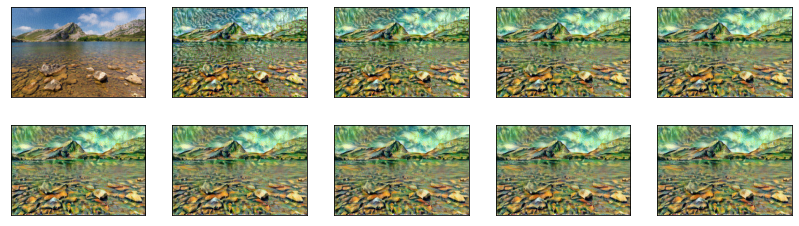

In [ ]:
model_name = 'vgg19' #'vgg19' #'xception'
optimizer = 'Adam'
best, best_loss = run_style_transfer(content_path, style_path,
                                      model_name, optimizer,num_iterations=1000)

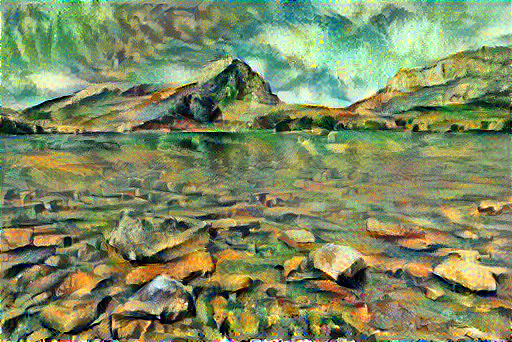

In [ ]:
Image.fromarray(best)

The result obtained for 1000 iterations is positive. We manage to apply the style of the style image on the content image. Increasing the number of iterations to 10000 enabled us to obtain even better results with less blured parts.

To download the image from Colab uncomment the following code:

In [ ]:
#from google.colab import files
#files.download('wave_turtle.png')

## Visualize outputs
We "deprocess" the output image in order to remove the processing that was applied to it. 

In [ ]:
def show_results(best_img, content_path, style_path, show_large_final=True):
  plt.figure(figsize=(10, 5))
  content = load_img(content_path) 
  style = load_img(style_path)

  plt.subplot(1, 2, 1)
  imshow(content, 'Content Image')

  plt.subplot(1, 2, 2)
  imshow(style, 'Style Image')

  if show_large_final: 
    plt.figure(figsize=(10, 10))

    plt.imshow(best_img)
    plt.title('Output Image')
    plt.show()

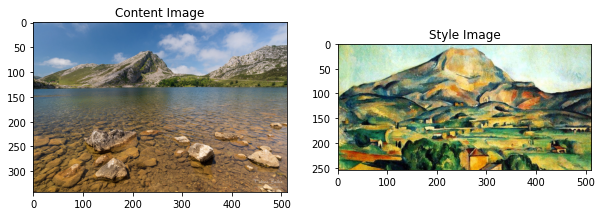

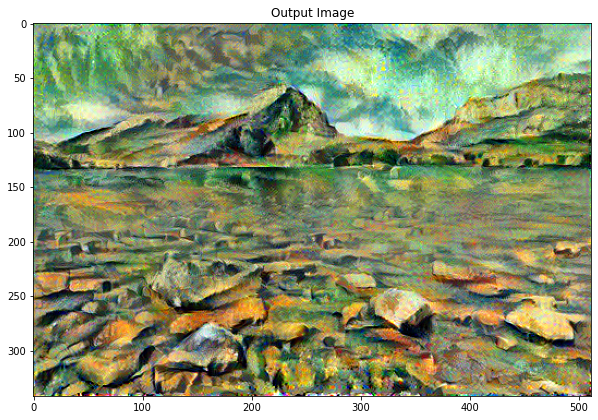

In [ ]:
show_results(best, content_path, style_path)

## Try different preprocessing models


### VGG16

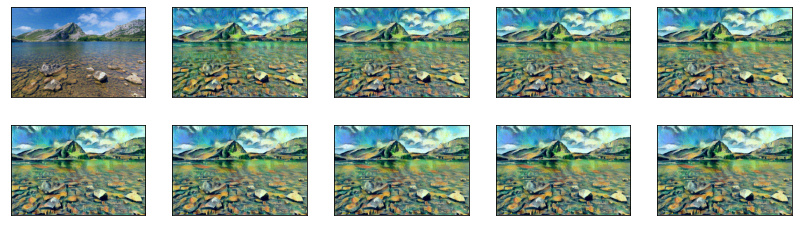

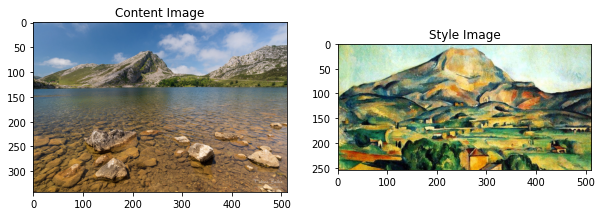

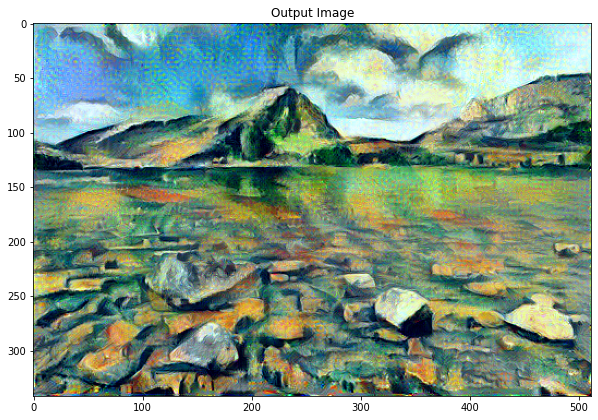

In [ ]:
model_name = 'vgg16' #'vgg19' #'xception'
optimizer = 'Adam'
best, best_loss = run_style_transfer(content_path, style_path,
                                      model_name, optimizer,num_iterations=1000)
show_results(best, content_path, style_path)

The result obtained for 1000 iterations is very aesthetic. However, if we take a closer look to the sky, it has less details for VGG16 than for VGG19. Hence, VGG19 seems to be the best pretrained network for Style Transfer. This result is consistent with the litterature.

### Xception

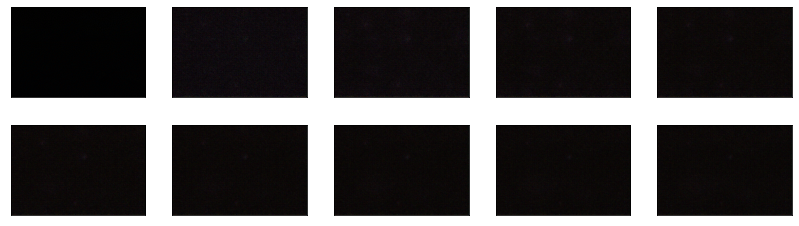

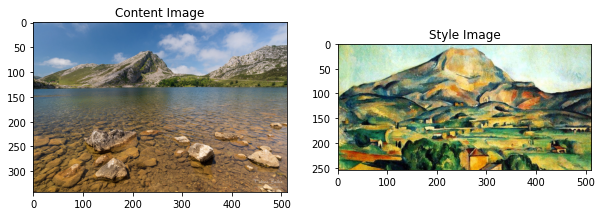

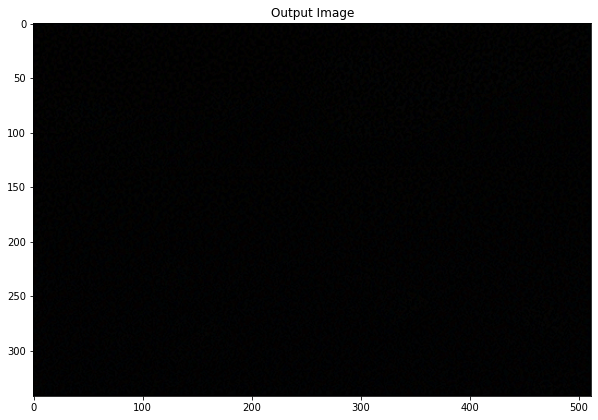

In [ ]:
model_name = 'Xception' #'vgg19' #'xception'
optimizer = 'Adam'
best, best_loss = run_style_transfer(content_path, style_path,
                                      model_name, optimizer, num_iterations=1000)
show_results(best, content_path, style_path)

Xception gives the black screen as output in all cases showing that the weights are not compatible with the model. This also seems to be the case in the literature.

## Compare different optimizers

For the following study, we will be using the VGG19 pretained neural network. We compare different optimizer (Adam, SGD and RMSprop) to find out which one provide the most satisfying visual result. 

Adam :

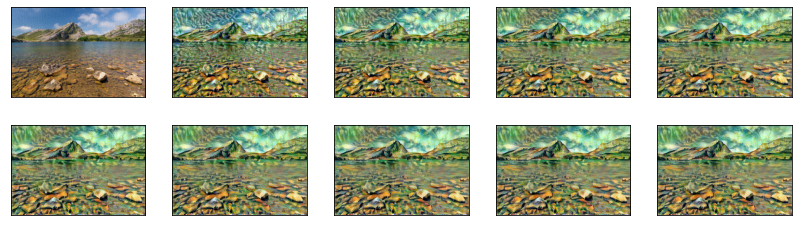

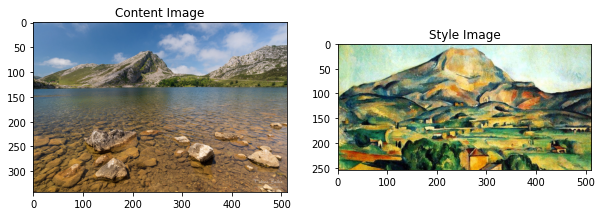

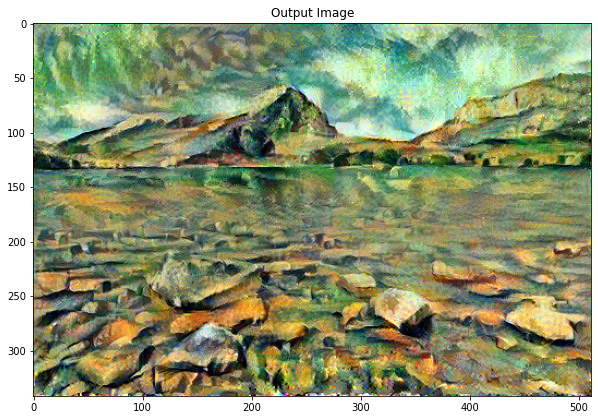

In [ ]:
model_name = 'vgg19' #'vgg19' #'xception'
optimizer = 'Adam' #SGD, RMSprop
best, best_loss = run_style_transfer(content_path, style_path,
                                      model_name, optimizer, num_iterations=1000)
show_results(best, content_path, style_path)



---


Sotachastic Gradient Descend :

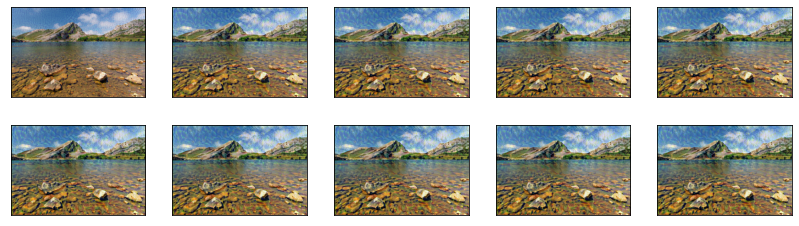

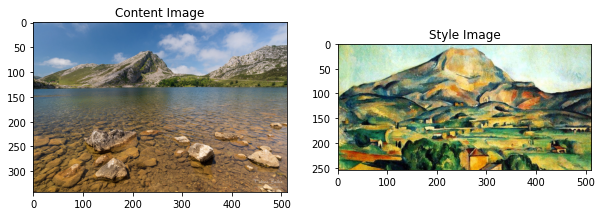

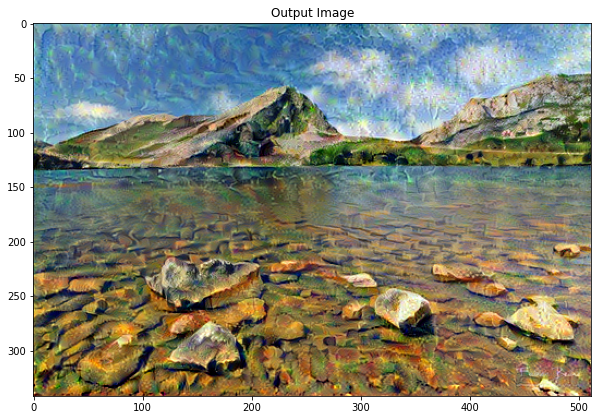

In [ ]:
optimizer = 'SGD' #SGD, RMSprop
best, best_loss = run_style_transfer(content_path, style_path,
                                      model_name, optimizer, num_iterations=1000)
show_results(best, content_path, style_path)



---


RMSprop :

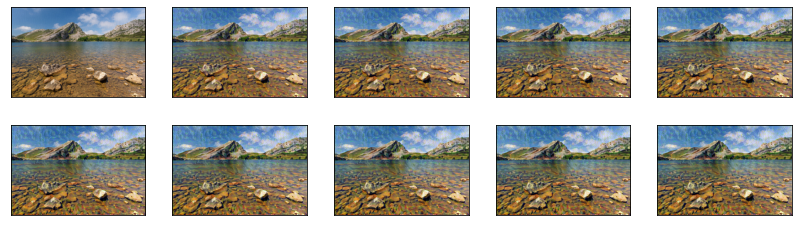

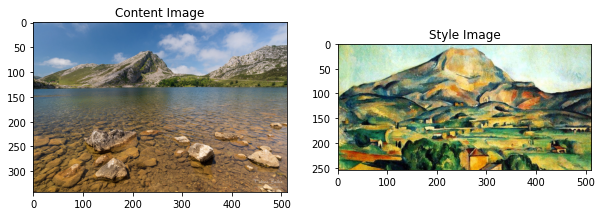

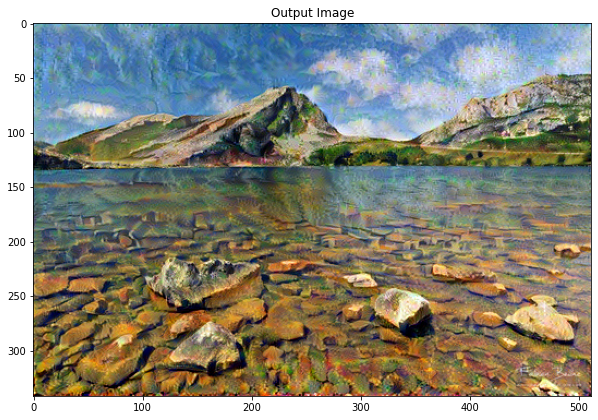

In [ ]:
optimizer = 'RMSprop' #SGD, RMSprop
best, best_loss = run_style_transfer(content_path, style_path,
                                      model_name, optimizer, num_iterations=1000)
show_results(best, content_path, style_path)

All in all, adam seems to produce the best results, especially for the large structures : the sky is green as in the style image, and both the sky and the water have less weird artifacts. In regards to these artifacts, RMSprop would be a bit better than SGD, as they are more rare in the water for RMSprop. Moroever, SGD is slower to converge than Adam.

The colors in general are closer to the style image with Adam than with the other two optimizers. For these reasons, we will use Adam in the last part of this project, where we will try to import some famous paintings styles on various pictures.

## Let's paint
Image of Tuebingen 

Photo By: Andreas Praefcke [GFDL (http://www.gnu.org/copyleft/fdl.html) or CC BY 3.0  (https://creativecommons.org/licenses/by/3.0)], from Wikimedia Commons

In [ ]:
model_name = 'vgg19'
optimizer = 'Adam'

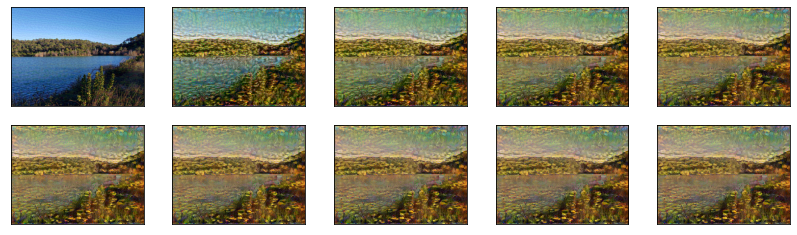

In [ ]:
best_starry_night, best_loss = run_style_transfer('/tmp/nst/lac-de-cécélès-scaled.jpg',
  '/tmp/nst/Claude_Monet_038.jpg',model_name, optimizer, num_iterations=1000)

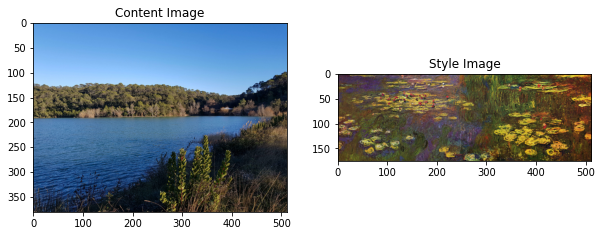

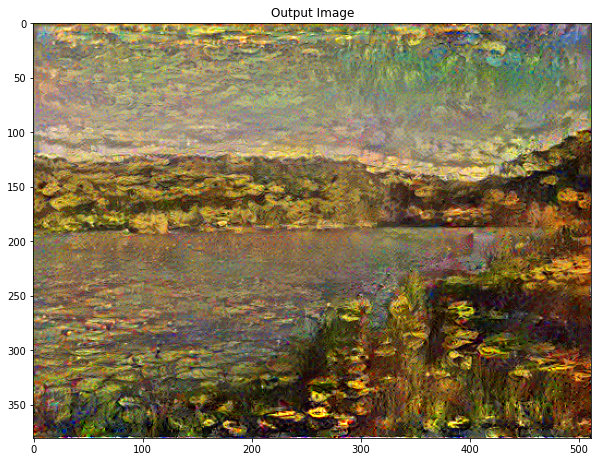

In [ ]:
show_results(best_starry_night, '/tmp/nst/lac-de-cécélès-scaled.jpg',
  '/tmp/nst/Claude_Monet_038.jpg')

We can see flowers in the sky, which seems absurd to us humans, but is understandable here : the style picture doesn't contain any sky, thus the network can't differenciate between sky and water. 



---



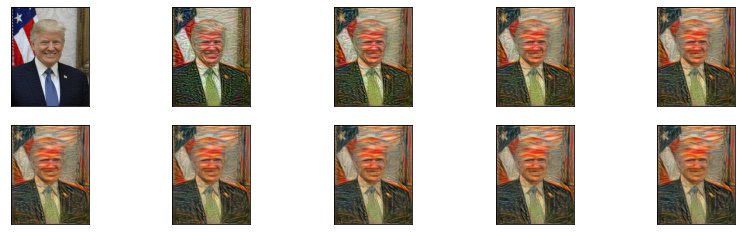

In [ ]:
best_starry_night, best_loss = run_style_transfer('/tmp/nst/1200px-Donald_Trump_official_portrait.jpg',
             '/tmp/nst/804px-The_Scream.jpg',model_name, optimizer, num_iterations=1000)

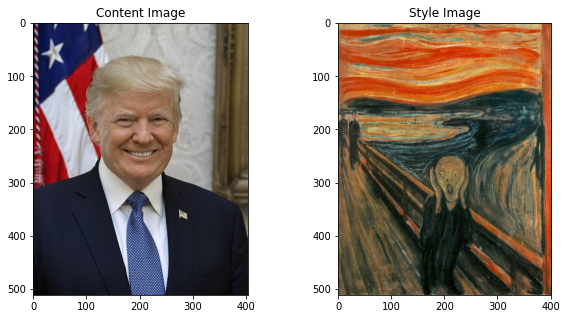

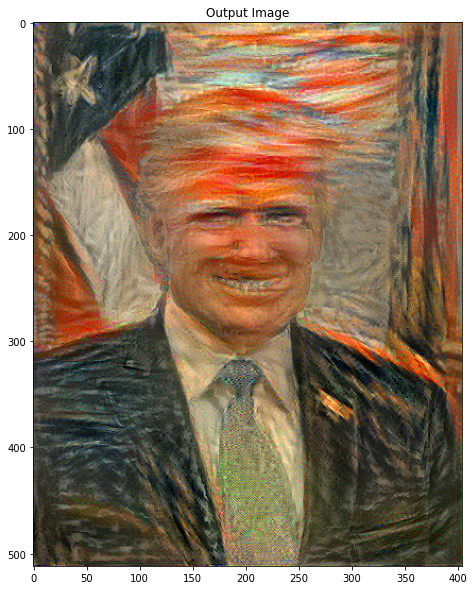

In [ ]:
show_results(best_starry_night, '/tmp/nst/1200px-Donald_Trump_official_portrait.jpg',
             '/tmp/nst/804px-The_Scream.jpg')

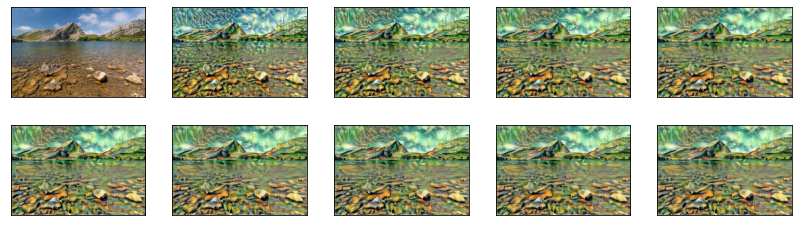

In [ ]:
best_starry_night, best_loss = run_style_transfer( '/tmp/nst/wrvTNwTSxuWjvfL6hdgy_Composition-photo-paysage.jpg',
  '/tmp/nst/image.jpg',model_name, optimizer, num_iterations=1000)

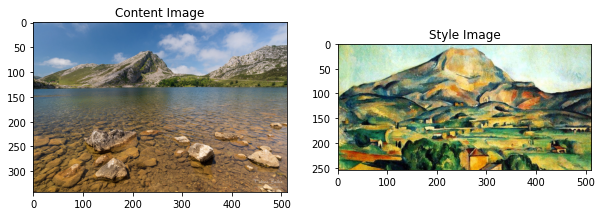

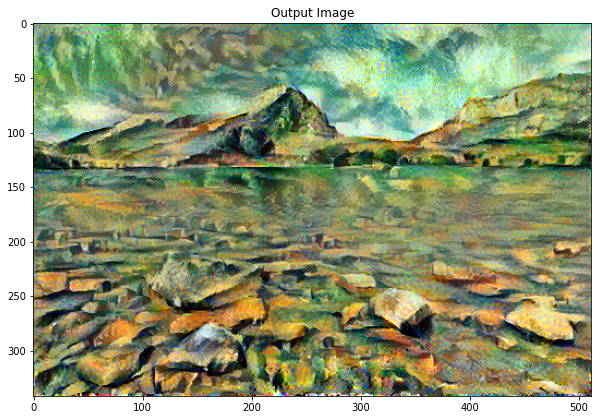

In [ ]:
show_results(best_starry_night, '/tmp/nst/wrvTNwTSxuWjvfL6hdgy_Composition-photo-paysage.jpg',
  '/tmp/nst/image.jpg')

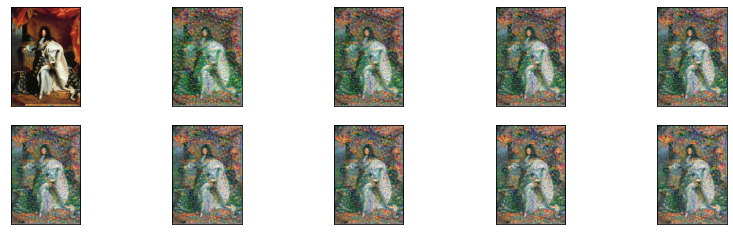

In [ ]:
model_name = 'vgg19' #'vgg19' #'xception'
optimizer = 'Adam'
best_starry_night, best_loss = run_style_transfer( '/tmp/nst/Louis_XIV_of_France.jpg',
  '/tmp/nst/d71f8039-17e9-45ef-94fe-05d30e46d2ab.jpg',model_name, optimizer, num_iterations=5000)

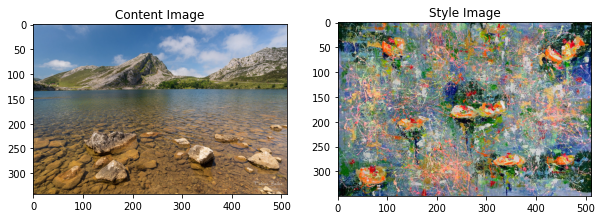

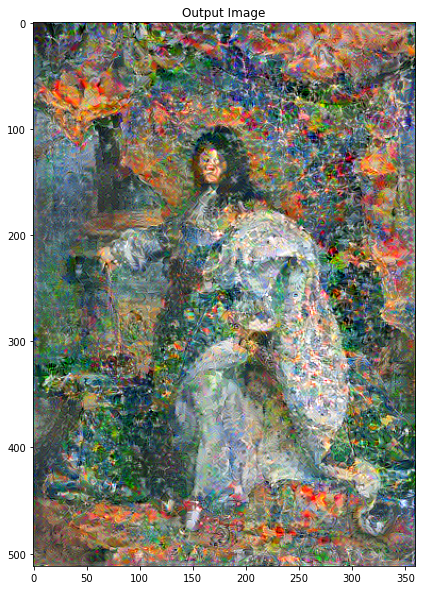

In [ ]:
show_results(best_starry_night, '/tmp/nst/wrvTNwTSxuWjvfL6hdgy_Composition-photo-paysage.jpg',
  '/tmp/nst/d71f8039-17e9-45ef-94fe-05d30e46d2ab.jpg')